<a href="https://colab.research.google.com/github/Ashish-Tripathy/cv_yantra_drishti/blob/master/Copy_of_EIP_GAN_faceAging_modified.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-tvb0_r3l
  Running command git clone -q https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-tvb0_r3l
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-cp36-none-any.whl size=101066 sha256=204847f5576772d4fcc9594f56fba9185aebff390f51c1bdc9827f79953d42f4
  Stored in directory: /tmp/pip-ephem-wheel-cache-5izk1cuc/wheels/11/27/c8/4ed56de7b55f4f61244e2dc6ef3cdbaff2692527a2ce6502ba
Successfully built keras-contrib


In [11]:
pip install scipy==0.19.1

In [0]:
from glob import glob
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras import backend
from keras import Input, Model
from keras.layers import Conv2D, BatchNormalization, Activation, Add, Conv2DTranspose, ZeroPadding2D, LeakyReLU, Lambda,ReLU
from keras.optimizers import Adam
from keras_contrib.layers import InstanceNormalization
from PIL import *
#from imageio import imread
#from skimage.transform import resize
from tensorflow.python.keras import backend as k
#from scipy.misc import imread, imresize


In [13]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [0]:
!tar -xvf "/content/gdrive/My Drive/EIP2/GAN/Data/crop_part1.tar.gz"

crop_part1/24_1_2_20170104020224692.jpg.chip.jpg
crop_part1/3_1_3_20161219230106056.jpg.chip.jpg
crop_part1/35_0_0_20170105162448427.jpg.chip.jpg
crop_part1/5_0_0_20170110213554657.jpg.chip.jpg
crop_part1/23_1_4_20170103223615095.jpg.chip.jpg
crop_part1/20_1_3_20170104231456714.jpg.chip.jpg
crop_part1/4_1_3_20161220220636202.jpg.chip.jpg
crop_part1/90_1_0_20170110182426286.jpg.chip.jpg
crop_part1/35_1_0_20170103182746666.jpg.chip.jpg
crop_part1/85_1_0_20170110181324285.jpg.chip.jpg
crop_part1/1_0_2_20161219211107805.jpg.chip.jpg
crop_part1/41_0_4_20170104205137196.jpg.chip.jpg
crop_part1/26_0_3_20170104230509745.jpg.chip.jpg
crop_part1/11_1_4_20170109201611941.jpg.chip.jpg
crop_part1/26_1_3_20170104223130527.jpg.chip.jpg
crop_part1/80_1_0_20170109142913604.jpg.chip.jpg
crop_part1/30_0_0_20170103181149464.jpg.chip.jpg
crop_part1/51_1_0_20170110160643172.jpg.chip.jpg
crop_part1/1_1_0_20170109191822349.jpg.chip.jpg
crop_part1/27_1_0_20170104234600194.jpg.chip.jpg
crop_part1/52_1_0_2017010

In [0]:
!mkdir utkdata


In [0]:
%%shell
mkdir testA
mkdir testB
for file in /content/crop_part1/*; do
MYVAR=$(basename "$file")
NAME=${MYVAR%%_*}
if([[ ($NAME -ge 20 && $NAME -le 30) ]])
then
  cp /content/crop_part1/$MYVAR testA
elif([[ ($NAME -ge 50 && $NAME -le 60) ]])
then
  cp /content/crop_part1/$MYVAR testB
else
  continue
fi
done

In [0]:
#!python /content/utkfaceCreateTrain.py -i testA -o testA_dict.mat
#!python /content/utkfaceCreateTrain.py -i testB -o testB_dict.mat

In [0]:
#import scipy.io
#mat = scipy.io.loadmat('utkfacedata.mat')

In [14]:
import os
dir = '/content/testB'
print(len([name for name in os.listdir(dir) if os.path.isfile(os.path.join(dir,name))]))

1075


In [0]:
def convolution(x, nb_filters, filter_size=3):
    x = Conv2D(filters=nb_filters, kernel_size=3, strides=2, padding="same")(x)
    x = InstanceNormalization(axis=1)(x)
    x = Activation("relu")(x)
    return x

In [0]:
def residual_block(x):
  """
  Residual block
"""
  #p = int((ks - 1) / 2)
  #res = tf.pad(x, [[0, 0], [p, p], [p, p], [0, 0]], "REFLECT") 
  res = Conv2D(filters=256, kernel_size=3, strides=1, padding="same")(x)
  res = InstanceNormalization(axis=1)(res)
  res = Activation('relu')(res)
  #res = tf.pad(res, [[0, 0], [p, p], [p, p], [0, 0]], "REFLECT")
  res = Conv2D(filters=256, kernel_size=3, strides=1, padding="same")(res)
  res = InstanceNormalization(axis=1)(res)

  return Add()([res, x])

In [0]:
def expand_label_input(x):
    x = K.expand_dims(x, axis=1)
    x = K.expand_dims(x, axis=1)
    x = K.tile(x, [1, 128, 128, 1])
    return x

In [0]:
def build_generator():
    """
    Create a generator network using the hyperparameter values defined below
    """
    input_shape = (128, 128, 3)
    residual_blocks = 9
    input_layer = Input(shape=input_shape)

    # First Convolution block
    x = Conv2D(filters=64, kernel_size=7, strides=1, padding="same")(input_layer)
    x = InstanceNormalization(axis=1)(x)
    x = Activation("relu")(x)

    # 2nd Convolution block
    x = Conv2D(filters=128, kernel_size=3, strides=2, padding="same")(x)
    x = InstanceNormalization(axis=1)(x)
    x = Activation("relu")(x)

    # 3rd Convolution block
    x = Conv2D(filters=256, kernel_size=3, strides=2, padding="same")(x)
    x = InstanceNormalization(axis=1)(x)
    x = Activation("relu")(x)

    # Residual blocks
    for _ in range(residual_blocks):
        x = residual_block(x)

    # Upsampling blocks

    # 1st Upsampling block
    x = Conv2DTranspose(filters=128, kernel_size=3, strides=2, padding='same', use_bias=False)(x)
    x = InstanceNormalization(axis=1)(x)
    x = Activation("relu")(x)

    # 2nd Upsampling block
    x = Conv2DTranspose(filters=64, kernel_size=3, strides=2, padding='same', use_bias=False)(x)
    x = InstanceNormalization(axis=1)(x)
    x = Activation("relu")(x)

    # Last Convolution layer
    x = Conv2D(filters=3, kernel_size=7, strides=1, padding="same")(x)
    output = Activation('tanh')(x)

    model = Model(inputs=[input_layer], outputs=[output])
    return model


In [0]:
def build_discriminator():
    """
    Create a discriminator network using the hyperparameter values defined below
    """
    input_shape = (128, 128, 3)
    hidden_layers = 3

    input_layer = Input(shape=input_shape)

    x = ZeroPadding2D(padding=(1, 1))(input_layer)

    # 1st Convolutional block
    x = Conv2D(filters=64, kernel_size=4, strides=2, padding="valid")(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = ZeroPadding2D(padding=(1, 1))(x)

    # 3 Hidden Convolution blocks
    for i in range(1, hidden_layers + 1):
        x = Conv2D(filters=2 ** i * 64, kernel_size=4, strides=2, padding="valid")(x)
        x = InstanceNormalization(axis=1)(x)
        x = LeakyReLU(alpha=0.2)(x)

        x = ZeroPadding2D(padding=(1, 1))(x)

    # Last Convolution layer
    output = Conv2D(filters=1, kernel_size=4, strides=1, activation="sigmoid")(x)

    model = Model(inputs=[input_layer], outputs=[output])
    return model


In [0]:
from PIL import Image
import numpy as np
import glob
from random import randint, shuffle

def load_data(file_pattern):
    print(file_pattern)
    return glob.glob(file_pattern)

def read_image(fn):
    im = Image.open(fn).convert('RGB')
    im = im.resize( (loadSize, loadSize), Image.BILINEAR )
    arr = np.array(im)/255*2-1
    w1,w2 = (loadSize-imageSize)//2,(loadSize+imageSize)//2
    h1,h2 = w1,w2
    img = arr[h1:h2, w1:w2, :]
    if randint(0,1):
        img=img[:,::-1]
    if channel_first:        
        img = np.moveaxis(img, 2, 0)
    return img

data = "young2old"
train_A = load_data('/content/trainYoung/*.jpg'.format(data))
train_B = load_data('/content/trainOld/*.jpg'.format(data))


In [0]:
imgA = imread('/content/testA/29_1_3_20170104234632266.jpg.chip.jpg', mode='RGB')

# Resize images
imgA = imresize(imgA, (64, 64))

/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/usr/local/lib/python3.6/dist-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):


In [0]:
data_dir = "/content"
batch_size = 1
epochs = 10

In [0]:
from PIL import Image
import numpy as np
import glob
from random import randint, shuffle
imagesA = glob(data_dir + '/testA/*.*')


In [0]:
############################################ Changes needed to get age, gender and race as one hot ecoders for each image #######################################

def load_images(data_dir):
    imagesA = glob(data_dir + '/testA/*.*')
    imagesB = glob(data_dir + '/testB/*.*')

    allImagesA = []
    allImagesB = []

    for index, filename in enumerate(imagesA):
      imA = Image.open(filename).convert('RGB')
      imB = Image.open(filename).convert('RGB')
      im = im.resize( (128, 128), Image.BILINEAR )
      arr = np.array(im)/255*2-1
      w1,w2 = (128-200)//2,(128+200)//2
      h1,h2 = w1,w2
      img = arr[h1:h2, w1:w2, :]
      if randint(0,1):
          img=img[:,::-1]
      return img

    for index, filename in enumerate(imagesA):
        # Load images
        if index < 1075:
          imgA = imread(filename, mode='RGB')
          imgB = imread(imagesB[index], mode='RGB')


        # Resize images
          imgA = imresize(imgA, (128, 128))
          imgB = imresize(imgB, (128, 128))

        # Randomly horizontally flip images
          if np.random.random() > 0.5:
              imgA = np.fliplr(imgA)
              imgB = np.fliplr(imgB)

          allImagesA.append(imgA)
          allImagesB.append(imgB)

    # Normalize images
    allImagesA = np.array(allImagesA) / 127.5 - 1.
    allImagesB = np.array(allImagesB) / 127.5 - 1.
    return allImagesA, allImagesB

In [0]:
def load_test_batch(data_dir, batch_size):
  
    imagesA = glob(data_dir + '/testA/*.*')
    imagesB = glob(data_dir + '/testB/*.*')

    imagesA = np.random.choice(imagesA, batch_size)
    imagesB = np.random.choice(imagesB, batch_size)
    allA=[]
    allB=[]
    for i in range(len(imagesA)):
          # Load images and resize images
          imgA = imresize(imread(imagesA[i], mode='RGB').astype(np.float32), (128, 128))
          imgB = imresize(imread(imagesB[i], mode='RGB').astype(np.float32), (128, 128))

          allA.append(imgA)
          allB.append(imgB)

    return np.array(allA) / 127.5 - 1.0, np.array(allB) / 127.5 - 1.0


def save_images(originalA, generatedB, recosntructedA, originalB, generatedA, reconstructedB, path):
    """
    Save images
    """
    fig = plt.figure()
    ax = fig.add_subplot(2, 3, 1)
    ax.imshow(originalA)
    ax.axis("off")
    ax.set_title("Original")

    ax = fig.add_subplot(2, 3, 2)
    ax.imshow(generatedB)
    ax.axis("off")
    ax.set_title("Generated")

    ax = fig.add_subplot(2, 3, 3)
    ax.imshow(recosntructedA)
    ax.axis("off")
    ax.set_title("Reconstructed")

    ax = fig.add_subplot(2, 3, 4)
    ax.imshow(originalB)
    ax.axis("off")
    ax.set_title("Original")

    ax = fig.add_subplot(2, 3, 5)
    ax.imshow(generatedA)
    ax.axis("off")
    ax.set_title("Generated")

    ax = fig.add_subplot(2, 3, 6)
    ax.imshow(reconstructedB)
    ax.axis("off")
    ax.set_title("Reconstructed")

    plt.savefig(path)


In [0]:
!rm -rf logs

In [0]:
def write_log(callback, name, loss, batch_no):
    """
    Write training summary to TensorBoard
    """
    summary = tf.Summary()
    summary_value = summary.value.add()
    summary_value.simple_value = loss
    summary_value.tag = name
    callback.writer.add_summary(summary, batch_no)
    callback.writer.flush()

In [0]:
import datetime
import os
!pip install -q tf-nightly-gpu-2.0-preview
#Load the TensorBoard notebook extension
%load_ext tensorboard
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard = tf.keras.callbacks.TensorBoard(logdir,  write_images=True, write_grads=True,write_graph=True)


     |████████████████████████████████| 383.7MB 72kB/s 
     |████████████████████████████████| 3.8MB 29.2MB/s 
     |████████████████████████████████| 71kB 23.3MB/s 
     |████████████████████████████████| 450kB 37.8MB/s 


In [0]:
%tensorboard --logdir logs

In [0]:
import warnings
import datetime
warnings.filterwarnings('ignore')
batch_size = 1
epochs = 150
mode = 'train'
start_time = datetime.datetime.now()

if mode == 'train':
    """
    Load dataset
    """
    imagesA, imagesB = load_images(data_dir=data_dir)

    # Define the common optimizer
    # Changed the learning rate for generator and discriminator with the aim that discriminator will learn more compared to generator
    d_optimizer = Adam(0.0004, 0.5)
    g_optimizer = Adam(0.0001, 0.5)
    common_optimizer = Adam(0.0002, 0.5)
    
    # Build and compile generator networks
    discriminatorA = build_discriminator()
    discriminatorB = build_discriminator()

    discriminatorA.compile(loss='mse', optimizer=d_optimizer, metrics=['accuracy'])
    discriminatorB.compile(loss='mse', optimizer=d_optimizer, metrics=['accuracy'])

    # Build generator networks
    generatorAToB = build_generator()
    generatorBToA = build_generator()

    """
    Create an adversarial network
    """
    inputA = Input(shape=(128, 128, 3))
    inputB = Input(shape=(128, 128, 3))

    # Generated images using both of the generator networks
    generatedB = generatorAToB(inputA)
    generatedA = generatorBToA(inputB)

    # Reconstruct images back to original images
    reconstructedA = generatorBToA(generatedB)
    reconstructedB = generatorAToB(generatedA)

    generatedAId = generatorBToA(inputA)
    generatedBId = generatorAToB(inputB)

    # Make both of the discriminator networks non-trainable
    discriminatorA.trainable = False
    discriminatorB.trainable = False

    probsA = discriminatorA(generatedA)
    probsB = discriminatorB(generatedB)

    adversarial_model = Model(inputs=[inputA, inputB],
                              outputs=[probsA, probsB, reconstructedA, reconstructedB,
                                       generatedAId, generatedBId])
    adversarial_model.compile(loss=['mse', 'mse', 'mae', 'mae', 'mae', 'mae'],
                              loss_weights=[1, 1, 10.0, 10.0, 1.0, 1.0],
                              optimizer=g_optimizer)

    #tensorboard = TensorBoard(log_dir="logs/{}".format(time.time()), write_images=True, write_grads=True,
     #                         write_graph=True)
    tensorboard.set_model(generatorAToB)
    tensorboard.set_model(generatorBToA)
    tensorboard.set_model(discriminatorA)
    tensorboard.set_model(discriminatorB)

   
    real_labels = np.ones((batch_size, 7, 7, 1))
    fake_labels = np.zeros((batch_size, 7, 7, 1))

    for epoch in range(epochs):
        print("Epoch:{}".format(epoch))

        dis_losses = []
        gen_losses = []

        num_batches = int(min(imagesA.shape[0], imagesB.shape[0]) / batch_size)
        print("Number of batches:{}".format(num_batches))

        for index in range(num_batches):
            print("Epoch:{}".format(epoch))
            print("Batch:{}".format(index))

            # Sample images
            batchA = imagesA[index * batch_size:(index + 1) * batch_size]
            batchB = imagesB[index * batch_size:(index + 1) * batch_size]

            # Translate images to opposite domain
            generatedB = generatorAToB.predict(batchA)
            generatedA = generatorBToA.predict(batchB)

            # Train the discriminator A on real and fake images
            dALoss1 = discriminatorA.train_on_batch(batchA, real_labels)
            dALoss2 = discriminatorA.train_on_batch(generatedA, fake_labels)

            # Train the discriminator B on ral and fake images
            dBLoss1 = discriminatorB.train_on_batch(batchB, real_labels)
            dbLoss2 = discriminatorB.train_on_batch(generatedB, fake_labels)

            # Calculate the total discriminator loss
            d_loss = 0.5 * np.add(0.5 * np.add(dALoss1, dALoss2), 0.5 * np.add(dBLoss1, dbLoss2))

            print("d_loss:{}".format(d_loss))

            """
            Train the generator networks
            """
            g_loss = adversarial_model.train_on_batch([batchA, batchB],
                                                      [real_labels, real_labels, batchA, batchB, batchA, batchB])

            print("g_loss:{}".format(g_loss))

            dis_losses.append(d_loss)
            gen_losses.append(g_loss)
            
        """
        Save losses to Tensorboard after each epoch
        """
        write_log(tensorboard, 'discriminator_loss', np.mean(dis_losses), epoch)
        write_log(tensorboard, 'generator_loss', np.mean(gen_losses), epoch)

        # Sample and save images after every 10 epochs
        if epoch % 10 == 0:
            # Get a batch of test data
            batchA, batchB = load_test_batch(data_dir=data_dir, batch_size=2)

            # Generate images
            generatedB = generatorAToB.predict(batchA)
            generatedA = generatorBToA.predict(batchB)

            # Get reconstructed images
            reconsA = generatorBToA.predict(generatedB)
            reconsB = generatorAToB.predict(generatedA)

            # Save original, generated and reconstructed images
            for i in range(len(generatedA)):
                save_images(originalA=batchA[i], generatedB=generatedB[i], recosntructedA=reconsA[i],
                            originalB=batchB[i], generatedA=generatedA[i], reconstructedB=reconsB[i],
                            path="/content/gdrive/My Drive/EIP2/GAN/gen_{}_{}".format(epoch, i))
                
                # Save models
                generatorAToB.save_weights("/content/gdrive/My Drive/EIP2/GAN/generatorAToB.h5")
                generatorBToA.save_weights("/content/gdrive/My Drive/EIP2/GAN/generatorBToB.h5")
                discriminatorA.save_weights("/content/gdrive/My Drive/EIP2/GAN/discriminatorA.h5")
                discriminatorB.save_weights("/content/gdrive/My Drive/EIP2/GAN/discriminatorB.h5")

elif mode == 'predict':
    # Build generator networks
    generatorAToB = build_generator()
    generatorBToA = build_generator()

    generatorAToB.load_weights("/content/gdrive/My Drive/EIP2/GAN/generatorAToB.h5")
    generatorBToA.load_weights("/content/gdrive/My Drive/EIP2/GAN/generatorBToB.h5")

    # Get a batch of test data
    batchA, batchB = load_test_batch(data_dir=data_dir, batch_size=2)

    # Save images
    generatedB = generatorAToB.predict(batchA)
    generatedA = generatorBToA.predict(batchB)

    reconsA = generatorBToA.predict(generatedB)
    reconsB = generatorAToB.predict(generatedA)

    for i in range(len(generatedA)):
        save_images(originalA=batchA[i], generatedB=generatedB[i], recosntructedA=reconsA[i],
                    originalB=batchB[i], generatedA=generatedA[i], reconstructedB=reconsB[i],
                    path="/content/gdrive/My Drive/EIP2/GAN/predict_{}".format(i))


g_loss:[1.7020295, 0.38105282, 0.36325184, 0.03639406, 0.043694265, 0.07441895, 0.082422666]
Batch:180
d_loss:[0.26469606 0.5561224 ]
g_loss:[1.906152, 0.58480036, 0.3608383, 0.04142023, 0.039294157, 0.10127442, 0.05209513]
Batch:181
d_loss:[0.17697462 0.8010204 ]
g_loss:[2.1752286, 0.3897919, 0.5744154, 0.063243255, 0.041410547, 0.08857235, 0.075910956]
Batch:182
d_loss:[0.24520631 0.5969388 ]
g_loss:[2.072596, 0.44888026, 0.477094, 0.04231972, 0.051409356, 0.09514856, 0.11418244]
Batch:183
d_loss:[0.23012002 0.6530613 ]
g_loss:[2.080056, 0.3238398, 0.5486535, 0.060071208, 0.04181411, 0.112991005, 0.07571851]
Batch:184
d_loss:[0.20309117 0.70408165]
g_loss:[2.3773348, 0.57350457, 0.43642455, 0.06045784, 0.06045414, 0.09136297, 0.06692283]
Batch:185
d_loss:[0.32281372 0.45408165]
g_loss:[1.9725621, 0.50367373, 0.35467517, 0.053991813, 0.04039585, 0.07389562, 0.09644094]
Batch:186
d_loss:[0.14622034 0.85714287]
g_loss:[2.0960171, 0.49303108, 0.66054183, 0.040557943, 0.036654472, 0.09125

W0822 21:35:25.288776 140343345092480 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0822 21:35:25.308004 140343345092480 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0822 21:35:25.327378 140343345092480 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0822 21:35:25.346237 140343345092480 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0822 21:35:25.364334 140343345092480 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0822 21:35:25.381279 140343345092480 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0822 21:35:28.450341 140343

Epoch:21
Number of batches:1075
Batch:0
d_loss:[0.20343763 0.6989796 ]
g_loss:[1.9693152, 0.4306815, 0.49320462, 0.03831508, 0.048948884, 0.076513164, 0.09627633]
Batch:1
d_loss:[0.19371246 0.7244898 ]
g_loss:[2.0493617, 0.41665342, 0.5745384, 0.04997872, 0.039365157, 0.086279646, 0.0784513]
Batch:2
d_loss:[0.22102508 0.6377551 ]
g_loss:[1.9268719, 0.4667545, 0.60546786, 0.038973235, 0.032624666, 0.07520695, 0.063463524]
Batch:3
d_loss:[0.29112798 0.44387752]
g_loss:[1.9132969, 0.3730974, 0.4512019, 0.03777534, 0.05135905, 0.09335094, 0.10430287]
Batch:4
d_loss:[0.1370258  0.90816325]
g_loss:[2.0017982, 0.50956786, 0.5889901, 0.03881997, 0.03586469, 0.07748306, 0.078910485]
Batch:5
d_loss:[0.2618996 0.5663265]
g_loss:[1.9821795, 0.45229098, 0.49706626, 0.034480486, 0.052142948, 0.07217483, 0.094413206]
Batch:6
d_loss:[0.19177508 0.7346939 ]
g_loss:[2.2167215, 0.39317593, 0.5456924, 0.06321696, 0.04945758, 0.07933497, 0.07177283]
Batch:7
d_loss:[0.12980255 0.91326535]
g_loss:[2.162987, 

In [0]:
import warnings
import datetime
warnings.filterwarnings('ignore')
batch_size = 1
epochs = 100
mode = 'predict'
start_time = datetime.datetime.now()

if mode == 'train':
    """
    Load dataset
    """
    imagesA, imagesB = load_images(data_dir=data_dir)

    # Define the common optimizer
    common_optimizer = Adam(0.0002, 0.5)

    # Build and compile generator networks
    discriminatorA = build_discriminator()
    discriminatorB = build_discriminator()

    discriminatorA.compile(loss='mse', optimizer=common_optimizer, metrics=['accuracy'])
    discriminatorB.compile(loss='mse', optimizer=common_optimizer, metrics=['accuracy'])

    # Build generator networks
    generatorAToB = build_generator()
    generatorBToA = build_generator()

    """
    Create an adversarial network
    """
    inputA = Input(shape=(128, 128, 3))
    inputB = Input(shape=(128, 128, 3))

    # Generated images using both of the generator networks
    generatedB = generatorAToB(inputA)
    generatedA = generatorBToA(inputB)

    # Reconstruct images back to original images
    reconstructedA = generatorBToA(generatedB)
    reconstructedB = generatorAToB(generatedA)

    generatedAId = generatorBToA(inputA)
    generatedBId = generatorAToB(inputB)

    # Make both of the discriminator networks non-trainable
    discriminatorA.trainable = False
    discriminatorB.trainable = False

    probsA = discriminatorA(generatedA)
    probsB = discriminatorB(generatedB)

    adversarial_model = Model(inputs=[inputA, inputB],
                              outputs=[probsA, probsB, reconstructedA, reconstructedB,
                                       generatedAId, generatedBId])
    adversarial_model.compile(loss=['mse', 'mse', 'mae', 'mae', 'mae', 'mae'],
                              loss_weights=[1, 1, 10.0, 10.0, 1.0, 1.0],
                              optimizer=common_optimizer)

#     #tensorboard = TensorBoard(log_dir="logs/{}".format(time.time()), write_images=True, write_grads=True,
#                               write_graph=True)
#     tensorboard.set_model(generatorAToB)
#     tensorboard.set_model(generatorBToA)
#     tensorboard.set_model(discriminatorA)
#     tensorboard.set_model(discriminatorB)

    real_labels = np.ones((batch_size, 7, 7, 1))
    fake_labels = np.zeros((batch_size, 7, 7, 1))

    for epoch in range(epochs):
        print("Epoch:{}".format(epoch))

        dis_losses = []
        gen_losses = []

        num_batches = int(min(imagesA.shape[0], imagesB.shape[0]) / batch_size)
        print("Number of batches:{}".format(num_batches))

        for index in range(num_batches):
            print("Batch:{}".format(index))

            # Sample images
            batchA = imagesA[index * batch_size:(index + 1) * batch_size]
            batchB = imagesB[index * batch_size:(index + 1) * batch_size]

            # Translate images to opposite domain
            generatedB = generatorAToB.predict(batchA)
            generatedA = generatorBToA.predict(batchB)

            # Train the discriminator A on real and fake images
            dALoss1 = discriminatorA.train_on_batch(batchA, real_labels)
            dALoss2 = discriminatorA.train_on_batch(generatedA, fake_labels)

            # Train the discriminator B on ral and fake images
            dBLoss1 = discriminatorB.train_on_batch(batchB, real_labels)
            dbLoss2 = discriminatorB.train_on_batch(generatedB, fake_labels)

            # Calculate the total discriminator loss
            d_loss = 0.5 * np.add(0.5 * np.add(dALoss1, dALoss2), 0.5 * np.add(dBLoss1, dbLoss2))

            print("d_loss:{}".format(d_loss))

            """
            Train the generator networks
            """
            g_loss = adversarial_model.train_on_batch([batchA, batchB],
                                                      [real_labels, real_labels, batchA, batchB, batchA, batchB])

            print("g_loss:{}".format(g_loss))

            dis_losses.append(d_loss)
            gen_losses.append(g_loss)
            
        """
        Save losses to Tensorboard after each epoch
        """
        #write_log(tensorboard, 'discriminator_loss', np.mean(dis_losses), epoch)
        #write_log(tensorboard, 'generator_loss', np.mean(gen_losses), epoch)

        # Sample and save images after every 10 epochs
        if epoch % 10 == 0:
            # Get a batch of test data
            batchA, batchB = load_test_batch(data_dir=data_dir, batch_size=2)

            # Generate images
            generatedB = generatorAToB.predict(batchA)
            generatedA = generatorBToA.predict(batchB)

            # Get reconstructed images
            reconsA = generatorBToA.predict(generatedB)
            reconsB = generatorAToB.predict(generatedA)

            # Save original, generated and reconstructed images
            for i in range(len(generatedA)):
                save_images(originalA=batchA[i], generatedB=generatedB[i], recosntructedA=reconsA[i],
                            originalB=batchB[i], generatedA=generatedA[i], reconstructedB=reconsB[i],
                            path="/content/gdrive/My Drive/EIP2/GAN/gen_{}_{}".format(epoch, i))
                
    # Save models
    generatorAToB.save_weights("/content/gdrive/My Drive/EIP2/GAN/generatorAToB.h5")
    generatorBToA.save_weights("/content/gdrive/My Drive/EIP2/GAN/generatorBToB.h5")
    discriminatorA.save_weights("/content/gdrive/My Drive/EIP2/GAN/discriminatorA.h5")
    discriminatorB.save_weights("/content/gdrive/My Drive/EIP2/GAN/discriminatorB.h5")

elif mode == 'predict':
    # Build generator networks
    generatorAToB = build_generator()
    generatorBToA = build_generator()

    generatorAToB.load_weights("/content/gdrive/My Drive/EIP2/GAN/generatorAToB.h5")
    generatorBToA.load_weights("/content/gdrive/My Drive/EIP2/GAN/generatorBToB.h5")

    # Get a batch of test data
    batchA, batchB = load_test_batch(data_dir=data_dir, batch_size=1)

    # Save images
    generatedB = generatorAToB.predict(batchA)
    generatedA = generatorBToA.predict(batchB)

    reconsA = generatorBToA.predict(generatedB)
    reconsB = generatorAToB.predict(generatedA)

    for i in range(len(generatedA)):
        save_images(originalA=batchA[i], generatedB=generatedB[i], recosntructedA=reconsA[i],
                    originalB=batchB[i], generatedA=generatedA[i], reconstructedB=reconsB[i],
                    path="/content/gdrive/My Drive/EIP2/GAN/predict_{}".format(i))


W0807 13:52:55.766992 140476725696384 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Original')

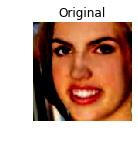

In [0]:
fig = plt.figure()
ax = fig.add_subplot(2, 3, 1)
ax.imshow(batchA[1])
ax.axis("off")
ax.set_title("Original")